# __*Generative Teaching Networks (GTNs)*__

A GTN, much like a GAN, is composed of 2 models: a Generator (i.e. Teacher), which produces synthetic data from noise, and Learner (i.e. Student), that trains on the synthetic data for some task. The key difference between a GAN and a GTN is that in a GAN, the 2 models work in an adversarial way, while in a GTN, the 2 models work cooperatively.

The main use of a GTN is to drastically reduce training times when we train multiple models. Alternatively, a GTN can also be used to find appropriate architechures for various problems. Also, a GTN can be trained on very training/validation little data.

The Generator used in the GTN is similar to a Conditional Generator used in the Condition GAN, which takes random noise as well as the class labels of the data for which it is trying to generate synthetic data.
The GTN implmented here also uses the following concepts: 

1. Meta-Learning: Meta-Learning refers to "learning to learn". These algorithms learn from the output of other Machine Learning algorithms. The Generator uses this concept 
2. Curriculum Learning: Training strategy that trains a Machine Learning model by providing data in a meaningful order. The noise used by the Generator is not random, it is learnt over time via backpropogation and is given in the same order to each Learner. This way the Generator uses noise that is most beneficial to the Learner to accelerate training. 
3. Neural Architecuture Search: USed to automate design of Deep Learning networks to achieve best possible performance with minimum amount of human supervision.


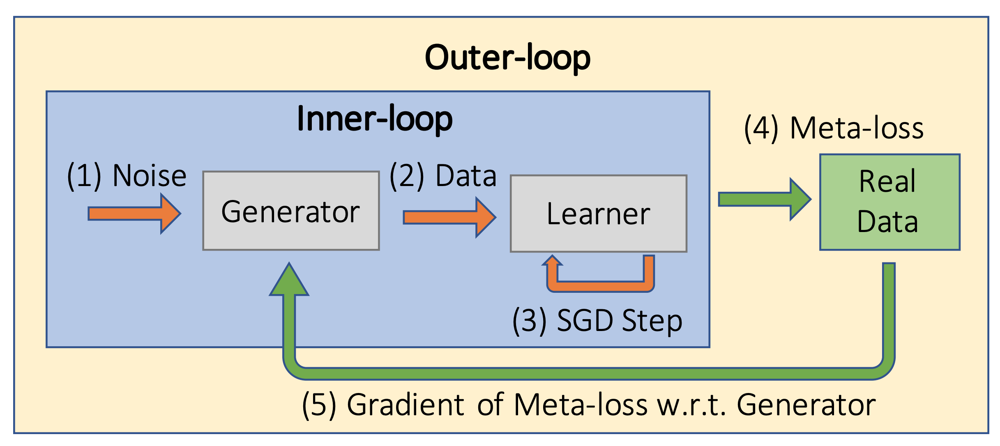

There are 2 loops, inner loop to train the Learner, and the outer loop that trains the Generator and optionally the noise. The Learner only learns on the synthetic data, and the Generator only learns on the real data.

1. The Generator takes the noise and the corresponding labels to generate synthetic data.
2. The Learner learnes on the synthetic data batches.
3. The Learner uses backpropogation to update it's parameters.
4. This trained Learner is finally given real data, loss (called Meta-Loss) is calculated. Gradients are calculated with respect to the Generators parameters and  then the Generator is updated.


For Meta-Loss, we use a library called Higher by Facebook AI Research which allows us to "unroll" inner higher gradients and hence supports higher order optimization. It turns torch.nn.Module instances "stateless" so that the changes made to the parameters can be tracked, and provides a suite of differential optimizers for Meta Learning.


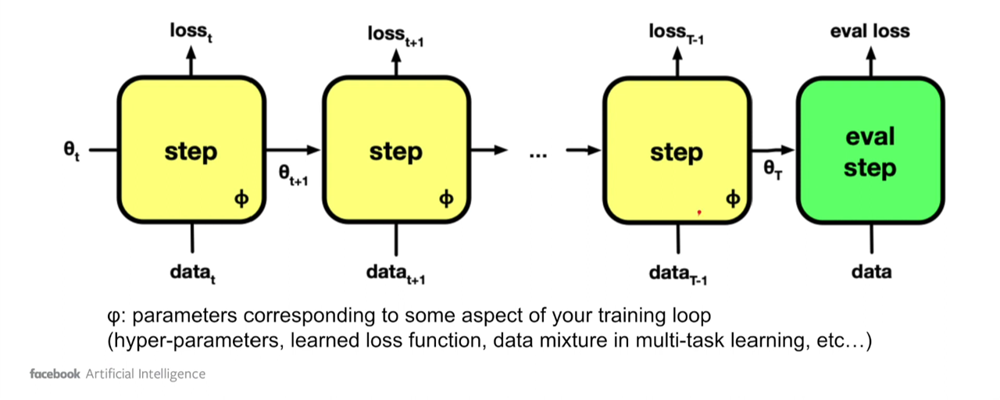

This diagram illustrates the training step that the Learner takes. The steps in yellow are the inner loop training steps using synthetic data. The data green used in the evaluation step. Backward pass starts at the evaluation loss and backpropogates through the various steps and to the indiviudal synthetic batches that the Generator generates. 


[Generative Teaching Networks: Accelerating Neural Architecture Search by Learning to Generate Synthetic Training Data (Such et al. 2019)](https://arxiv.org/abs/1912.07768)

# __*Importing Libraries*__


In [1]:
import os
import sys
from copy import deepcopy
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import time
import random
import gc
import pandas as pd
from collections import defaultdict


import torch
import torch.nn as nn
import torch.optim as optim
from torch import Tensor

import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torchvision.utils import make_grid
from torch.nn.utils import weight_norm
# import torch.distributed as dist

# import torchopt
# import functorch

from koila import lazy
import higher

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
os.environ['TF_FORCE_GPU_ALLOW_GROWTH']='true'

import shutil
if os.path.exists('checkpoints'):
    shutil.rmtree('checkpoints')
    
    
num_classes = 10 

In [2]:
def seed_everything(seed=1234):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
seed_everything()

def recursive_detach(target) :
    if isinstance(target, Tensor):
        target = target.detach()
        return target
    elif isinstance(target,dict):
        return {k:recursive_detach(v) for k,v in target.items()}
    elif isinstance(target,list):
        return [recursive_detach(v) for v in target]
    elif isinstance(target,tuple):
        return tuple(recursive_detach(v) for v in target)
    else:
        return target

    
def diffopt_state_dict(diffopt):
    param_mappings = {}
    start_index = 0
    with torch.no_grad():
        def pack_group(group):
            nonlocal start_index
            packed = {k: v for k, v in group.items() if k != 'params'}
            
            param_mappings.update({id(p): i for i, p in enumerate(group['params'], start_index) if id(p) not in param_mappings})
            
            packed['params'] = [param_mappings[id(p)] for p in group['params']]
            start_index += len(packed['params'])
            return packed

        res = defaultdict(dict)
        param_groups = [pack_group(g) for g in diffopt.param_groups]
        for group_idx, group in enumerate(diffopt.param_groups):
            for p_idx, p in enumerate(group['params']):
                res[p] = { k:v for k,v in diffopt.state[group_idx][p_idx].items() }
        
        param_groups = recursive_detach(param_groups)
        packed_state = {(param_mappings[id(k)] if isinstance(k, Tensor) else k): recursive_detach(v) for k, v in res.items()}
        return {'state':packed_state,'param_groups':param_groups}
    
def plot_results(images, r=False):                        ## Helps plot images
    images = images.detach().cpu()
    images = (images + 1) / 2 
    # display.clear_output(wait=False)
    image_grid = make_grid(images, nrow=num_classes)
    plt.figure(figsize=(20,12))
    plt.imshow(image_grid.permute(1, 2, 0),cmap='gray')
    plt.axis("off")
    plt.show()
    
def weights_init(m):
    if isinstance(m, nn.Linear):
        torch.nn.init.kaiming_uniform_(m.weight)
    if isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.kaiming_uniform_(m.weight)
    if isinstance(m, nn.Conv2d):
        torch.nn.init.kaiming_uniform_(m.weight)

def cycle(iterable):
    while True:
        for x in iterable:
            yield x

# __*Parameters*__

In [14]:
world_size = torch.cuda.device_count() ## Number of GPU's available

num_classes = 10                       ## Number of classes in the dataset
inner_loop_iterations = 32             ## Number of iterations in the inner training loop

LIM = 100                              ## Number of iterations in the outer loop

noise_size = 128                       ## Dimension of the noise vector used by the Generator
batch_size = 256                       ## Number of images in a batch in the inner loop

use_curriculum = True                  ## Enables Curriculum Learning

# __*Importing Data*__


In [4]:
transform = transforms.Compose([
    transforms.Lambda(lambda x: np.array(x)),
    transforms.ToTensor(),
#     torchvision.transforms.Resize((32,48),antialias=False),
    transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)),
])

# train = datasets.MNIST('./data', train=True, transform=transform, download=True)
# train, val = torch.utils.data.random_split(train, [50000, 10000])
# test = datasets.MNIST('./data', train=False, transform=transform, download=True)


train = datasets.CIFAR10('./data', train=True, transform=transform, download=True)
train, val = torch.utils.data.random_split(train, [inner_loop_iterations * batch_size, 50000 - inner_loop_iterations * batch_size])
test = datasets.CIFAR10('./data', train=False, transform=transform, download=True)

train = torch.utils.data.DataLoader(train, batch_size = batch_size, shuffle=True, drop_last=True)
val = torch.utils.data.DataLoader(val, batch_size = batch_size * 2, shuffle=True, drop_last=True)
test = torch.utils.data.DataLoader(test, batch_size = batch_size * 2, shuffle=True, drop_last=True)

steps_per_epoch = len(val)


train_loader = iter(cycle(train))
val_loader   = iter(cycle(val))
test_loader  = iter(cycle(test)) 

loader = next(train_loader)

img_size = loader[0].shape[2:]  
depth = loader[0].shape[1]   

Files already downloaded and verified
Files already downloaded and verified


# __*Teacher Architcture*__

In [5]:
# class Teacher(nn.Module):
#     def __init__(self):
#         super().__init__()
#         self.total_dim = noise_size+num_classes
#         self.model = nn.Sequential(
#             weight_norm(nn.Linear(self.total_dim,img_size[0]//4 * img_size[1]//4 * self.total_dim)),
#             nn.SELU(), 
#             nn.Unflatten(1, ( self.total_dim, img_size[0]//4 , img_size[1]//4 )),
            
#             nn.ConvTranspose2d(self.total_dim, 128, 4, 2, padding = 1),
#             nn.BatchNorm2d(128),
#             nn.SELU(),
            
#             nn.ConvTranspose2d(128, 64, 4, 2, padding = 1),
#             nn.BatchNorm2d(64),
#             nn.SELU(),
            
#             nn.ConvTranspose2d(64, depth, 3, 1, padding = 1),
#             nn.Tanh()
                    
#             )
#         self.model.apply(weights_init)
    
        
#     def forward(self, x, noise):
#         x = torch.cat([x, noise], dim=1)      ## Concatenating Noise and Label Vectors :     (? , noise_vec + num_classes)        
#         return self.model(x) 

# # out_dim = strides * (in_dim - 1) + kernel_size - 2*padding

In [6]:
class Teacher(nn.Module):
    def __init__(self):
        super().__init__()
        conv1_filters = 64
        fc1_size = 1024
        self.fc2_filters = 8
        self.fc2_size = self.fc2_filters * img_size[0] * img_size[1]
        
        self.model=nn.Sequential(
            weight_norm(nn.Linear(noise_size + num_classes, fc1_size)),
            nn.LeakyReLU(0.1),
            nn.BatchNorm1d(fc1_size),
            
            weight_norm(nn.Linear(fc1_size, self.fc2_size)),
            nn.LeakyReLU(0.1),
            nn.Unflatten(1, ( self.fc2_filters, img_size[0] , img_size[1])),

            
            nn.BatchNorm2d(self.fc2_filters),
            
            weight_norm(nn.Conv2d(self.fc2_filters, conv1_filters, 3, 1, padding= "same")),
            nn.LeakyReLU(0.1),
            nn.BatchNorm2d(conv1_filters),
            
            weight_norm(nn.Conv2d(conv1_filters, depth, 3, 1, padding= "same")),
            nn.Tanh()
        )
        
        self.model.apply(weights_init)
        
            
    def forward(self, x, target):
        x = torch.cat([x, target], dim=1)            
        return self.model(x)

# __*Learner Architecture*__


In [7]:
class Learner(nn.Module):
    def __init__(self, cnn_filters=None, linear_filters=None):
        super().__init__()
        self.model=nn.Sequential()
        
        
        ########################################################################################################################################
        if isinstance(cnn_filters,np.ndarray) or isinstance(cnn_filters,list) :
            cnn_layers = len(cnn_filters)
            cnn_filters= list(cnn_filters)
        else:
            cnn_layers = np.random.randint(2,4)
            cnn_filters = list(np.random.randint(low=64, high=256, size=(cnn_layers,)))
        cnn_filters = [depth]+cnn_filters
        
        for i in range(cnn_layers):
            this_block=self.cnn_block(cnn_filters[i], cnn_filters[i+1])
            # self.model = nn.Sequential(*self.model.children(),*this_block.children())
            self.model.append(this_block)
            
        self.model.append(nn.Flatten())
        
        ########################################################################################################################################
        
        initial_filters= cnn_filters[-1] * img_size[0]//(2**cnn_layers) * img_size[1]//(2**cnn_layers) 
        if isinstance(linear_filters,np.ndarray) or isinstance(linear_filters,list) :
            linear_layers = len(linear_filters)
            linear_filters = list(linear_filters)
        else: 
            linear_layers = np.random.randint(1,3)
            linear_filters = list(np.random.randint(low=64, high=256, size=(linear_layers,))) 

        linear_filters = [initial_filters] + linear_filters + [num_classes] 
        
        for i in range(linear_layers+1):
            if i != linear_layers:
                this_block=self.linear_block(linear_filters[i],linear_filters[i+1])
            else:
                this_block=self.linear_block(linear_filters[i],linear_filters[i+1], final=True)
            # self.model = nn.Sequential(*self.model.children(),*this_block.children())
            self.model.append(this_block)
            
        self.model.apply(weights_init)

    
    def cnn_block(self,initial_filters, final_filters):
        this_block = nn.Sequential(
                    nn.Conv2d(initial_filters, final_filters, kernel_size = 3, stride = 1, padding = 'same'),
                    nn.BatchNorm2d(final_filters, track_running_stats = False, momentum = 0),
                    nn.LeakyReLU(0.1),
                    nn.MaxPool2d(2,2)
                    )
        return this_block
    
    
    def linear_block(self,initial_filters, final_filters, final=False):
        if final==False:
            this_block = nn.Sequential(
                        nn.Linear(initial_filters, final_filters),
                        nn.BatchNorm1d(final_filters, track_running_stats = False, momentum = 0),
                        nn.LeakyReLU(0.1),
                        )
        else:
            this_block = nn.Sequential(
                        nn.Linear(initial_filters, final_filters))
        return this_block
    
    def forward(self, x):
        return self.model(x)

# __*Initialization*__

In [15]:
use_teacher = False
use_curriculum = True 

params_to_train = []

if use_teacher == True:
    teacher = Teacher().to(device)
#     teacher = nn.DataParallel(teacher, device_ids=list(range(torch.cuda.device_count())))
    
    params_to_train += list(teacher.parameters())
    if use_curriculum ==True:
        teacher_noise = nn.Parameter(torch.randn(inner_loop_iterations, batch_size, noise_size), requires_grad=True) 
        params_to_train += [teacher_noise]
    
    teacher_labels = torch.arange(batch_size) % num_classes                        ## Creating Labels for Generator
    one_hot = nn.functional.one_hot(teacher_labels, num_classes)                                        ## One hot encoding above labels
        
else: 
    curriculum_data=[]
    curriculum_labels = []

    for i in range(inner_loop_iterations):
        loader = next(train_loader)
        curriculum_data  +=[loader[0]]
        curriculum_labels+=[loader[1]]

    curriculum_data = nn.Parameter(torch.stack((curriculum_data),0).detach(),requires_grad=True)
    curriculum_labels = torch.stack(curriculum_labels,0).detach()
    params_to_train += [curriculum_data]

optimizer_name = "sgd"
optimizer_input = {'lr': 0.02, 'momentum':0.9}
# optimizer_input = {'lr': 0.02}

    
if optimizer_name == 'adam':
#     ADAM: lr, weight_decay, amsgrad, betas
    default_optimizer = optim.Adam
    
if optimizer_name == 'sgd':
    #  SGD: lr, weight_decay, momentum, dampening, nesterov
    default_optimizer = optim.SGD

optim_params = [nn.Parameter(Tensor(x).to(device)) if isinstance(x,list) else nn.Parameter(Tensor([x]).to(device))  for x in optimizer_input.values()]     
# optim_params = nn.Parameter(Tensor(list(optimizer_input.values())).to(device), requires_grad=True)                          ## Parameters for SGD optimizer are also learnt 
params_to_train += optim_params


optimizer_teacher = optim.Adam(params_to_train,0.002, [0.9,0.9])                                                           ## Optimizer for Generator
loss_fn = nn.CrossEntropyLoss()                                                                                ## Loss Fn used by the Learner

epochs = 1
plot_steps = 25
batch_exe = 4         
def divide_chunks(l, n):
    for i in range(0, len(l), n): 
        yield l[i:i + n]
  
batches = list(divide_chunks(list(range(inner_loop_iterations)), batch_exe))

path='./checkpoints'
if not os.path.exists(path):
    os.makedirs(path)

{'lr': Parameter containing:
 tensor([0.1472], device='cuda:0', requires_grad=True),
 'momentum': Parameter containing:
 tensor([0.6179], device='cuda:0', requires_grad=True)}

In [16]:
mylearners = [Learner(np.random.randint(low=32, high=256, size=(3,)),
                      np.random.randint(low=32, high=128, size=(1,)))
              for i in range(LIM)]


# __*GTN Training Loop*__

E:0	B:0	 Train Acc: 46.48%  Loss: 1.421 	 Val Acc: 50.78%  Loss: 1.360   	 Test Acc: 50.00%  Loss: 1.439  	IT: 1
E:0	B:1	 Train Acc: 47.66%  Loss: 1.395 	 Val Acc: 47.46%  Loss: 1.488   	 Test Acc: 51.17%  Loss: 1.389  	IT: 2
E:0	B:2	 Train Acc: 43.75%  Loss: 1.378 	 Val Acc: 46.88%  Loss: 1.442   	 Test Acc: 48.63%  Loss: 1.387  	IT: 3
E:0	B:3	 Train Acc: 52.34%  Loss: 1.298 	 Val Acc: 50.20%  Loss: 1.395   	 Test Acc: 50.39%  Loss: 1.359  	IT: 4
E:0	B:4	 Train Acc: 50.00%  Loss: 1.287 	 Val Acc: 50.98%  Loss: 1.327   	 Test Acc: 54.49%  Loss: 1.295  	IT: 5
E:0	B:5	 Train Acc: 51.56%  Loss: 1.287 	 Val Acc: 51.17%  Loss: 1.365   	 Test Acc: 52.34%  Loss: 1.337  	IT: 6
E:0	B:6	 Train Acc: 54.69%  Loss: 1.249 	 Val Acc: 55.08%  Loss: 1.283   	 Test Acc: 52.34%  Loss: 1.294  	IT: 7
E:0	B:7	 Train Acc: 52.34%  Loss: 1.229 	 Val Acc: 53.91%  Loss: 1.263   	 Test Acc: 53.32%  Loss: 1.309  	IT: 8
E:0	B:8	 Train Acc: 55.86%  Loss: 1.164 	 Val Acc: 55.66%  Loss: 1.232   	 Test Acc: 53.52%  Los

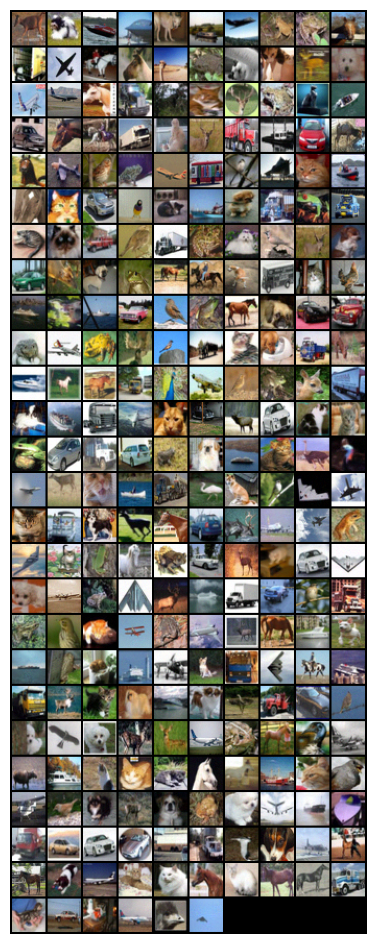

E:0	B:25	 Train Acc: 60.16%  Loss: 1.044 	 Val Acc: 58.01%  Loss: 1.203   	 Test Acc: 55.86%  Loss: 1.236  	IT: 26
E:0	B:26	 Train Acc: 65.23%  Loss: 1.030 	 Val Acc: 60.35%  Loss: 1.119   	 Test Acc: 55.27%  Loss: 1.154  	IT: 27
E:0	B:27	 Train Acc: 48.83%  Loss: 1.284 	 Val Acc: 49.80%  Loss: 1.346   	 Test Acc: 48.05%  Loss: 1.417  	IT: 28
E:0	B:28	 Train Acc: 60.16%  Loss: 1.126 	 Val Acc: 54.30%  Loss: 1.281   	 Test Acc: 55.47%  Loss: 1.231  	IT: 29
E:0	B:29	 Train Acc: 58.59%  Loss: 1.072 	 Val Acc: 56.64%  Loss: 1.142   	 Test Acc: 54.69%  Loss: 1.244  	IT: 30
E:0	B:30	 Train Acc: 60.94%  Loss: 1.069 	 Val Acc: 56.05%  Loss: 1.208   	 Test Acc: 55.08%  Loss: 1.239  	IT: 31
E:0	B:31	 Train Acc: 63.67%  Loss: 1.022 	 Val Acc: 57.42%  Loss: 1.214   	 Test Acc: 57.81%  Loss: 1.197  	IT: 32
E:0	B:32	 Train Acc: 60.94%  Loss: 1.083 	 Val Acc: 55.86%  Loss: 1.235   	 Test Acc: 56.45%  Loss: 1.182  	IT: 33
E:0	B:33	 Train Acc: 61.33%  Loss: 1.124 	 Val Acc: 57.62%  Loss: 1.228   	 Test

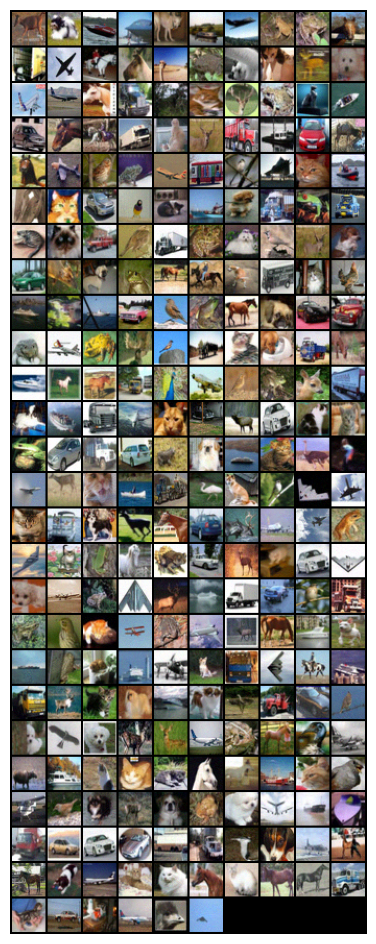

E:0	B:50	 Train Acc: 62.89%  Loss: 1.074 	 Val Acc: 57.62%  Loss: 1.125   	 Test Acc: 51.95%  Loss: 1.314  	IT: 51
E:0	B:51	 Train Acc: 61.33%  Loss: 1.092 	 Val Acc: 55.08%  Loss: 1.279   	 Test Acc: 55.27%  Loss: 1.256  	IT: 52
E:0	B:52	 Train Acc: 61.72%  Loss: 1.033 	 Val Acc: 61.72%  Loss: 1.091   	 Test Acc: 57.23%  Loss: 1.174  	IT: 53
E:0	B:53	 Train Acc: 65.62%  Loss: 1.007 	 Val Acc: 59.96%  Loss: 1.142   	 Test Acc: 59.57%  Loss: 1.145  	IT: 54
E:0	B:54	 Train Acc: 59.77%  Loss: 1.151 	 Val Acc: 54.10%  Loss: 1.327   	 Test Acc: 57.03%  Loss: 1.253  	IT: 55
E:0	B:55	 Train Acc: 62.11%  Loss: 1.132 	 Val Acc: 57.23%  Loss: 1.179   	 Test Acc: 55.66%  Loss: 1.275  	IT: 56
E:0	B:56	 Train Acc: 58.20%  Loss: 1.146 	 Val Acc: 56.05%  Loss: 1.254   	 Test Acc: 58.01%  Loss: 1.174  	IT: 57
E:0	B:57	 Train Acc: 69.53%  Loss: 1.013 	 Val Acc: 61.33%  Loss: 1.137   	 Test Acc: 59.38%  Loss: 1.138  	IT: 58
E:0	B:58	 Train Acc: 62.11%  Loss: 1.108 	 Val Acc: 56.05%  Loss: 1.176   	 Test

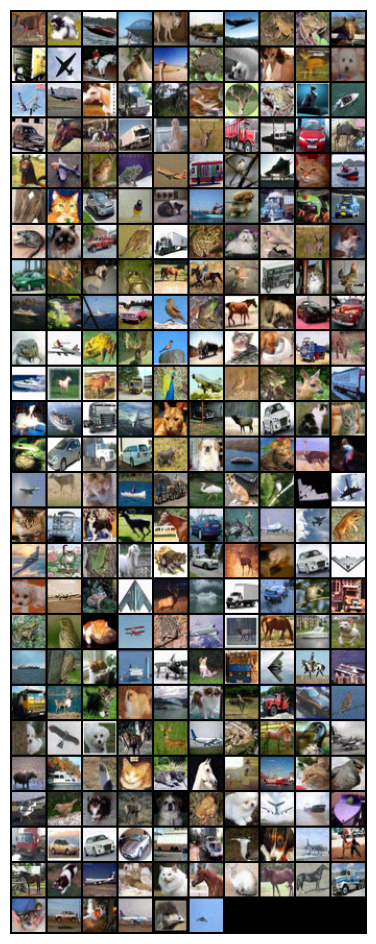

E:0	B:75	 Train Acc: 71.88%  Loss: 0.897 	 Val Acc: 57.81%  Loss: 1.204   	 Test Acc: 59.57%  Loss: 1.111  	IT: 76
E:0	B:76	 Train Acc: 64.84%  Loss: 0.970 	 Val Acc: 63.28%  Loss: 1.130   	 Test Acc: 60.74%  Loss: 1.150  	IT: 77
E:0	B:77	 Train Acc: 58.59%  Loss: 1.177 	 Val Acc: 52.15%  Loss: 1.273   	 Test Acc: 51.95%  Loss: 1.316  	IT: 78
E:0	B:78	 Train Acc: 67.97%  Loss: 0.971 	 Val Acc: 55.08%  Loss: 1.222   	 Test Acc: 55.66%  Loss: 1.224  	IT: 79
E:0	B:79	 Train Acc: 65.23%  Loss: 1.079 	 Val Acc: 57.03%  Loss: 1.195   	 Test Acc: 60.16%  Loss: 1.215  	IT: 80
E:0	B:80	 Train Acc: 62.50%  Loss: 1.080 	 Val Acc: 55.47%  Loss: 1.252   	 Test Acc: 55.08%  Loss: 1.243  	IT: 81
E:1	B:0	 Train Acc: 67.58%  Loss: 0.942 	 Val Acc: 55.86%  Loss: 1.213   	 Test Acc: 56.84%  Loss: 1.125  	IT: 82
E:1	B:1	 Train Acc: 65.23%  Loss: 1.031 	 Val Acc: 55.47%  Loss: 1.209   	 Test Acc: 57.62%  Loss: 1.215  	IT: 83
E:1	B:2	 Train Acc: 67.58%  Loss: 0.958 	 Val Acc: 57.62%  Loss: 1.159   	 Test Ac

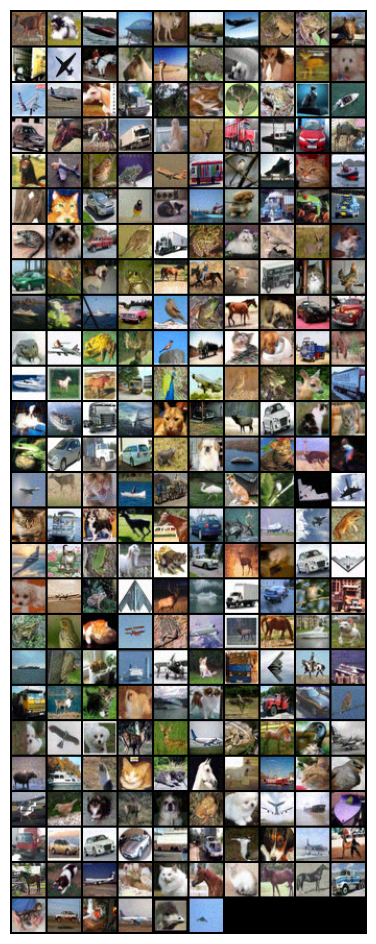



Total Time Taken:  956.7870657444 	 Average Time:  9.567870657444


In [17]:
# curriculum_data.requires_grads=True

gtn = pd.DataFrame(columns= ('Path','Train Loss','Train Accuracy','Validation Loss','Validation Accuracy','Test Loss','Test Accuracy'))
path='./checkpoints/gtn'
if not os.path.exists(path):
    os.makedirs(path)

if use_teacher == True:
    teacher.train()

then = time.time()
for it in range(LIM):
    learner = deepcopy(mylearners[it]).to(device)
    inner_optim = default_optimizer(learner.parameters(), lr=0.01)
    metrics={'Train Loss':[],'Train Accuracy':[],'Validation Loss':[],'Validation Accuracy':[],'Test Loss':[],'Test Accuracy':[]}

    for epoch in range(epochs):
        
        for batchsetid, batchset in enumerate(batches):
            optimizer_teacher.zero_grad(set_to_none=True)
            learner.train()
            val_data, val_target = next(val_loader)
            (val_data, val_target) = lazy(val_data, val_target, batch=0)
            
            with higher.innerloop_ctx(learner, inner_optim, override = {key: [value] for key,value in zip(list(optimizer_input.keys()),optim_params)} ) as (flearner, diffopt):
                
                for step in batchset:
                    if use_teacher == True:
                        if use_curriculum == True:
                            z_vec = teacher_noise[step]
                        else:
                            z_vec = torch.randn(batch_size, noise_size).to(device)
                        train_data, train_target = teacher(z_vec.to(device), one_hot.to(device)), teacher_labels
                    else:
                        train_data, train_target = curriculum_data[step], curriculum_labels[step]

                    train_data, train_target= train_data.to(device), train_target.to(device)
                    train_output = flearner(train_data)
                    train_loss = loss_fn(train_output, train_target) 
                    train_pred = train_output.argmax(dim=1, keepdim=True) 
                    train_accuracy = np.round(train_pred.eq(train_target.view_as(train_pred)).sum().item() / batch_size * 100, 2)
                    diffopt.step(train_loss)
            
                val_data, val_target= val_data.to(device), val_target.to(device)
                val_output = flearner(val_data)
                val_loss = loss_fn(val_output, val_target)
                val_pred = val_output.argmax(dim=1, keepdim=True)
                val_accuracy = np.round(val_pred.eq(val_target.view_as(val_pred)).sum().item() / (2 * batch_size) * 100, 2)
                val_loss.backward()
                optimizer_teacher.step()

                learner.load_state_dict(flearner.state_dict())
                inner_optim.load_state_dict(diffopt_state_dict(diffopt))
                
                
        with torch.no_grad():
            del flearner, diffopt
            gc.collect()
            torch.cuda.empty_cache()
    
            learner.eval()
            test_data, test_target = next(test_loader)
            (test_data, test_target) = lazy(test_data, test_target, batch=0)
            test_data, test_target= test_data.to(device), test_target.to(device)

            test_output = learner(test_data) 
            test_loss = loss_fn(test_output, test_target)
            test_pred = test_output.argmax(dim=1, keepdim=True)
            test_accuracy = np.round(test_pred.eq(test_target.view_as(test_pred)).sum().item() / (2 * batch_size) * 100 ,2)

            metrics["Train Accuracy"].append(train_accuracy)
            metrics["Train Loss"].append(np.round(train_loss.item(),3))
            metrics["Validation Accuracy"].append(val_accuracy)
            metrics["Validation Loss"].append(np.round(val_loss.item(),3))
            metrics["Test Accuracy"].append(test_accuracy)
            metrics["Test Loss"].append(np.round(test_loss.item(),3))

    print("E:",it//steps_per_epoch, 
                  "\tB:",it%steps_per_epoch, 
                  "\t Train Acc: %5.2f" % train_accuracy, "%",
                  "  Loss: %.3f" % np.round(train_loss.item(),3),
                  " \t Val Acc: %5.2f" % val_accuracy, "%",
                  "  Loss: %.3f" % np.round(val_loss.item(),3), 
                  "   \t Test Acc: %5.2f" % test_accuracy, "%",
                  "  Loss: %.3f" % np.round(test_loss.item(),3), 
                  "  \tIT: ",(it+1),
                  sep=""
                 )
            
            
    inner_optim.zero_grad()
    checkpoint = { 'model': learner, 'optimizer': inner_optim.state_dict() }
    metrics["Path"] = f'{path}/{it}.pth'
    torch.save(checkpoint, metrics['Path'])
#     metrics["Model"]=learner.to('cpu')
#     metrics["Optimizer"]=None
    
    gtn.loc[it] = metrics
    if (it + 1) % plot_steps == 0:
        plot_results(train_data)    


    del train_loss, val_loss, test_loss, train_data, val_data, test_data, learner, inner_optim
    gc.collect()
    torch.cuda.empty_cache()
    

now = time.time()
# curriculum_data.requires_grads=False

print("\n\nTotal Time Taken: ",now-then, "\t Average Time: ", (now-then)/LIM)

In [18]:
if use_teacher == True:
    curriculum_data=[]
    curriculum_labels=[]
    with torch.no_grad():
        for step in range(inner_loop_iterations):
            curriculum_data += [teacher(teacher_noise[step].to(device),one_hot.to(device)).detach()]
            curriculum_labels += [teacher_labels]
            curriculum_data[step].requires_grads = False
            plot_results(curriculum_data[step])
            
        curriculum_data = nn.Parameter(torch.stack((curriculum_data),0).detach(),requires_grad=False)

# __*GTN Curriculum*__

In [ ]:
# gtncurriculum = pd.DataFrame(columns= ('Path','Train Loss','Train Accuracy','Validation Loss','Validation Accuracy','Test Loss','Test Accuracy'))
# path='checkpoints/gtncurriculum'
# if not os.path.exists(path):
#     os.makedirs(path)

# train_target = Tensor([x % num_classes for x in range(batch_size)]).to(device)      ## Creating Labels for Generator

# then = time.time()
# for it in range(LIM):
#     learner = deepcopy(mylearners[it]).to(device)
#     inner_optim = optim.Adam(learner.parameters(), lr=0.01)
#     metrics={'Train Loss':[],'Train Accuracy':[],'Validation Loss':[],'Validation Accuracy':[],'Test Loss':[],'Test Accuracy':[]}

#     for epoch in range(epochs):
        
#         for batchset in batches:
#             learner.train()
#             with higher.innerloop_ctx(learner, inner_optim) as (flearner, diffopt):
                
#                 for step in batchset:
#                     if use_teacher == True:
#                         train_data, train_target = curriculum_data[step], train_target
#                     else:
#                         train_data, train_target = curriculum_data[step], curriculum_labels[step]

#                     train_data, train_target= train_data.to(device, non_blocking=True), train_target.to(device, non_blocking=True)
#                     train_output = flearner(train_data)
#                     train_loss = loss_fn(train_output, train_target) 
#                     train_pred = train_output.argmax(dim=1, keepdim=True) 
#                     train_accuracy = np.round(train_pred.eq(train_target.view_as(train_pred)).sum().item() / batch_size * 100, 2)
#                     diffopt.step(train_loss)
                    

#                 learner.load_state_dict(flearner.state_dict())
#                 inner_optim.load_state_dict(diffopt_state_dict(diffopt))
        
#         with torch.no_grad():
#             del flearner, diffopt
#             gc.collect()
#             torch.cuda.empty_cache()
    
#             learner.eval()
#             val_data, val_target = val_loader[(it* epochs + epoch) % len(val_loader)]
#             (val_data, val_target) = lazy(val_data, val_target, batch=0)
#             val_data, val_target= val_data.to(device), val_target.to(device)
#             val_output = learner(val_data)
#             val_loss = loss_fn(val_output, val_target)
#             val_pred = val_output.argmax(dim=1, keepdim=True)
#             val_accuracy = np.round(val_pred.eq(val_target.view_as(val_pred)).sum().item() / (2 * batch_size) * 100, 2)
        
#             test_data, test_target = test_loader[(it* epochs + epoch) % len(test_loader)]
#             (test_data, test_target) = lazy(test_data, test_target, batch=0)
#             test_data, test_target= test_data.to(device), test_target.to(device)
#             test_output = learner(test_data)
#             test_loss = loss_fn(test_output, test_target)
#             test_pred = test_output.argmax(dim=1, keepdim=True)
#             test_accuracy = np.round(test_pred.eq(test_target.view_as(test_pred)).sum().item() / (2 * batch_size) * 100 ,2)

#             metrics["Train Accuracy"].append(train_accuracy)
#             metrics["Train Loss"].append(np.round(train_loss.item(),3))
#             metrics["Validation Accuracy"].append(val_accuracy)
#             metrics["Validation Loss"].append(np.round(val_loss.item(),3))
#             metrics["Test Accuracy"].append(test_accuracy)
#             metrics["Test Loss"].append(np.round(test_loss.item(),3))
            
#     print("E:",it//len(val_loader), 
#                   "\tB:",it%len(val_loader), 
#                   "\t Train Acc: %5.2f" % train_accuracy, "%",
#                   "  Loss: %.3f" % np.round(train_loss.item(),3),
#                   " \t Val Acc: %5.2f" % val_accuracy, "%",
#                   "  Loss: %.3f" % np.round(val_loss.item(),3), 
#                   "   \t Test Acc: %5.2f" % test_accuracy, "%",
#                   "  Loss: %.3f" % np.round(test_loss.item(),3), 
#                   "  \tIT: ",(it+1),
#                   sep=""
#                  )
                    
#     inner_optim.zero_grad()
#     checkpoint = { 'model': learner.state_dict(), 'optimizer': inner_optim.state_dict() }
#     metrics["Path"] = f'{path}/{it}.pth'
#     torch.save(checkpoint, metrics['Path'])
# #     metrics["Model"]=learner.to('cpu')
# #     metrics["Optimizer"]=None
    
#     gtncurriculum.loc[it] = metrics
#     if (it + 1) % plot_steps == 0:
#         plot_results(train_data) 
        
#     del train_loss, val_loss, test_loss, train_data, val_data, test_data, learner, inner_optim
#     gc.collect()
#     torch.cuda.empty_cache()
    

# now = time.time()

# print("\n\nTotal Time Taken: ",now-then, "\t Average Time: ", (now-then)/LIM)

# __*GTN Dataset*__

In [ ]:
# gtndataset = pd.DataFrame(columns= ('Path','Train Loss','Train Accuracy','Validation Loss','Validation Accuracy','Test Loss','Test Accuracy'))
# path='./checkpoints/gtndataset'
# if not os.path.exists(path):
#     os.makedirs(path)

# train_target = Tensor([x % num_classes for x in range(batch_size)]).to(device)      ## Creating Labels for Generator

# then = time.time()
# for it in range(LIM):
#     learner = deepcopy(mylearners[it]).to(device)
#     inner_optim = optim.Adam(learner.parameters(), lr=0.01)
    
#     metrics={'Train Loss':[],'Train Accuracy':[],'Validation Loss':[],'Validation Accuracy':[],'Test Loss':[],'Test Accuracy':[]}
#     for epoch in range(epochs):
        
#         for batchset in batches:
#             learner.train()
#             with higher.innerloop_ctx(learner, inner_optim) as (flearner, diffopt):
                
#                 for step in batchset:
#                     train_data, train_target = train_loader[step]
#                     train_data, train_target= train_data.to(device, non_blocking=True), train_target.to(device, non_blocking=True)
#                     train_output = flearner(train_data)
#                     train_loss = loss_fn(train_output, train_target) 
#                     train_pred = train_output.argmax(dim=1, keepdim=True) 
#                     train_accuracy = np.round(train_pred.eq(train_target.view_as(train_pred)).sum().item() / batch_size * 100, 2)
#                     diffopt.step(train_loss)
                    

#                 learner.load_state_dict(flearner.state_dict())
#                 inner_optim.load_state_dict(diffopt_state_dict(diffopt))
        
#         with torch.no_grad():
#             del flearner, diffopt
#             gc.collect()
#             torch.cuda.empty_cache()
    
#             learner.eval()
#             val_data, val_target = val_loader[(it* epochs + epoch) % len(val_loader)]
#             (val_data, val_target) = lazy(val_data, val_target, batch=0)
#             val_data, val_target= val_data.to(device), val_target.to(device)
#             val_output = learner(val_data)
#             val_loss = loss_fn(val_output, val_target)
#             val_pred = val_output.argmax(dim=1, keepdim=True)
#             val_accuracy = np.round(val_pred.eq(val_target.view_as(val_pred)).sum().item() / (2 * batch_size) * 100, 2)
        
#             test_data, test_target = test_loader[(it* epochs + epoch) % len(test_loader)]
#             (test_data, test_target) = lazy(test_data, test_target, batch=0)
#             test_data, test_target= test_data.to(device), test_target.to(device)
#             test_output = learner(test_data)
#             test_loss = loss_fn(test_output, test_target)
#             test_pred = test_output.argmax(dim=1, keepdim=True)
#             test_accuracy = np.round(test_pred.eq(test_target.view_as(test_pred)).sum().item() / (2 * batch_size) * 100 ,2)

#             metrics["Train Accuracy"].append(train_accuracy)
#             metrics["Train Loss"].append(np.round(train_loss.item(),3))
#             metrics["Validation Accuracy"].append(val_accuracy)
#             metrics["Validation Loss"].append(np.round(val_loss.item(),3))
#             metrics["Test Accuracy"].append(test_accuracy)
#             metrics["Test Loss"].append(np.round(test_loss.item(),3))
            
#     print("E:",it//len(val_loader), 
#                   "\tB:",it%len(val_loader), 
#                   "\t Train Acc: %5.2f" % train_accuracy, "%",
#                   "  Loss: %.3f" % np.round(train_loss.item(),3),
#                   " \t Val Acc: %5.2f" % val_accuracy, "%",
#                   "  Loss: %.3f" % np.round(val_loss.item(),3), 
#                   "   \t Test Acc: %5.2f" % test_accuracy, "%",
#                   "  Loss: %.3f" % np.round(test_loss.item(),3), 
#                   "  \tIT: ",(it+1),
#                   sep=""
#                  )
                    
#     inner_optim.zero_grad()
#     checkpoint = { 'model': learner.state_dict(), 'optimizer': inner_optim.state_dict() }
#     metrics["Path"] = f'{path}/{it}.pth'
#     torch.save(checkpoint, metrics['Path'])
# #     metrics["Model"]=learner.to('cpu')
# #     metrics["Optimizer"]=None
    
#     gtndataset.loc[it] = metrics
#     if (it + 1) % plot_steps == 0:
#         plot_results(train_data) 
    
#     del train_loss, val_loss, test_loss, train_data, val_data, test_data, learner, inner_optim
#     gc.collect()
#     torch.cuda.empty_cache()
    

# now = time.time()

# print("\n\nTotal Time Taken: ",now-then, "\t Average Time: ", (now-then)/LIM)

# __*Normal Curriculum*__

In [19]:
mylearners = [Learner(np.random.randint(low=32, high=256, size=(3,)),
                      np.random.randint(low=32, high=128, size=(1,)))
              for i in range(LIM)]


{'lr': 0.1471838802099228, 'momentum': 0.6178561449050903}

E:0	B:0	 Train Acc: 64.84%  Loss: 0.977 	 Val Acc: 58.40%  Loss: 1.142   	 Test Acc: 57.81%  Loss: 1.156  	IT: 1
E:0	B:1	 Train Acc: 61.33%  Loss: 1.023 	 Val Acc: 55.66%  Loss: 1.246   	 Test Acc: 57.62%  Loss: 1.215  	IT: 2
E:0	B:2	 Train Acc: 65.62%  Loss: 0.949 	 Val Acc: 59.96%  Loss: 1.111   	 Test Acc: 57.81%  Loss: 1.178  	IT: 3
E:0	B:3	 Train Acc: 68.36%  Loss: 0.952 	 Val Acc: 56.64%  Loss: 1.201   	 Test Acc: 63.09%  Loss: 1.067  	IT: 4
E:0	B:4	 Train Acc: 59.38%  Loss: 1.065 	 Val Acc: 58.98%  Loss: 1.159   	 Test Acc: 55.86%  Loss: 1.213  	IT: 5
E:0	B:5	 Train Acc: 66.80%  Loss: 0.917 	 Val Acc: 60.16%  Loss: 1.159   	 Test Acc: 59.57%  Loss: 1.158  	IT: 6
E:0	B:6	 Train Acc: 69.92%  Loss: 0.896 	 Val Acc: 54.88%  Loss: 1.245   	 Test Acc: 56.45%  Loss: 1.170  	IT: 7
E:0	B:7	 Train Acc: 66.80%  Loss: 0.975 	 Val Acc: 59.77%  Loss: 1.147   	 Test Acc: 58.40%  Loss: 1.130  	IT: 8
E:0	B:8	 Train Acc: 71.48%  Loss: 0.943 	 Val Acc: 58.59%  Loss: 1.175   	 Test Acc: 59.18%  Los

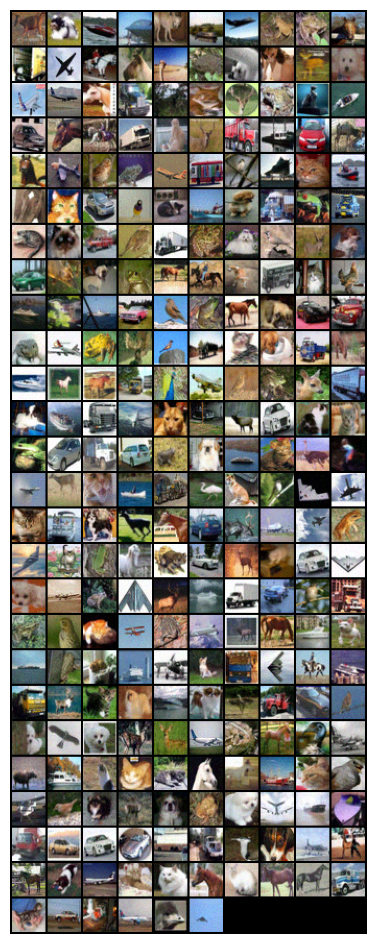

E:0	B:25	 Train Acc: 68.36%  Loss: 0.952 	 Val Acc: 59.57%  Loss: 1.172   	 Test Acc: 59.57%  Loss: 1.119  	IT: 26
E:0	B:26	 Train Acc: 63.28%  Loss: 1.066 	 Val Acc: 55.47%  Loss: 1.225   	 Test Acc: 53.91%  Loss: 1.255  	IT: 27
E:0	B:27	 Train Acc: 62.89%  Loss: 1.047 	 Val Acc: 58.79%  Loss: 1.216   	 Test Acc: 55.47%  Loss: 1.219  	IT: 28
E:0	B:28	 Train Acc: 61.33%  Loss: 1.082 	 Val Acc: 50.98%  Loss: 1.377   	 Test Acc: 55.86%  Loss: 1.243  	IT: 29
E:0	B:29	 Train Acc: 67.19%  Loss: 1.011 	 Val Acc: 57.62%  Loss: 1.137   	 Test Acc: 57.23%  Loss: 1.231  	IT: 30
E:0	B:30	 Train Acc: 71.88%  Loss: 0.874 	 Val Acc: 59.57%  Loss: 1.136   	 Test Acc: 58.01%  Loss: 1.188  	IT: 31
E:0	B:31	 Train Acc: 62.89%  Loss: 0.982 	 Val Acc: 60.55%  Loss: 1.114   	 Test Acc: 64.84%  Loss: 0.983  	IT: 32
E:0	B:32	 Train Acc: 69.14%  Loss: 0.903 	 Val Acc: 57.81%  Loss: 1.168   	 Test Acc: 62.70%  Loss: 1.081  	IT: 33
E:0	B:33	 Train Acc: 64.06%  Loss: 0.997 	 Val Acc: 58.59%  Loss: 1.175   	 Test

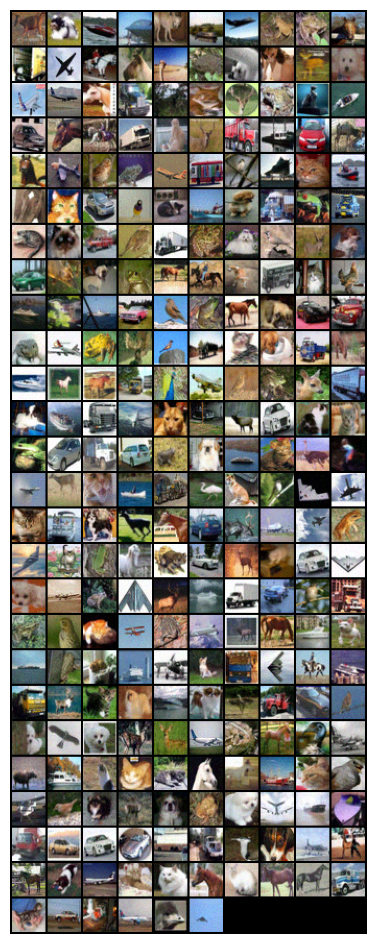

E:0	B:50	 Train Acc: 66.80%  Loss: 0.997 	 Val Acc: 53.91%  Loss: 1.185   	 Test Acc: 59.96%  Loss: 1.131  	IT: 51
E:0	B:51	 Train Acc: 66.41%  Loss: 0.925 	 Val Acc: 61.33%  Loss: 1.139   	 Test Acc: 58.20%  Loss: 1.174  	IT: 52
E:0	B:52	 Train Acc: 67.58%  Loss: 0.971 	 Val Acc: 59.18%  Loss: 1.134   	 Test Acc: 59.96%  Loss: 1.109  	IT: 53
E:0	B:53	 Train Acc: 69.14%  Loss: 0.914 	 Val Acc: 59.96%  Loss: 1.111   	 Test Acc: 60.35%  Loss: 1.087  	IT: 54
E:0	B:54	 Train Acc: 70.31%  Loss: 0.912 	 Val Acc: 61.72%  Loss: 1.100   	 Test Acc: 60.55%  Loss: 1.140  	IT: 55
E:0	B:55	 Train Acc: 69.14%  Loss: 0.946 	 Val Acc: 56.64%  Loss: 1.200   	 Test Acc: 57.03%  Loss: 1.145  	IT: 56
E:0	B:56	 Train Acc: 67.19%  Loss: 0.988 	 Val Acc: 58.79%  Loss: 1.203   	 Test Acc: 60.35%  Loss: 1.158  	IT: 57
E:0	B:57	 Train Acc: 68.36%  Loss: 0.926 	 Val Acc: 63.09%  Loss: 1.097   	 Test Acc: 58.20%  Loss: 1.134  	IT: 58
E:0	B:58	 Train Acc: 65.23%  Loss: 0.966 	 Val Acc: 57.23%  Loss: 1.201   	 Test

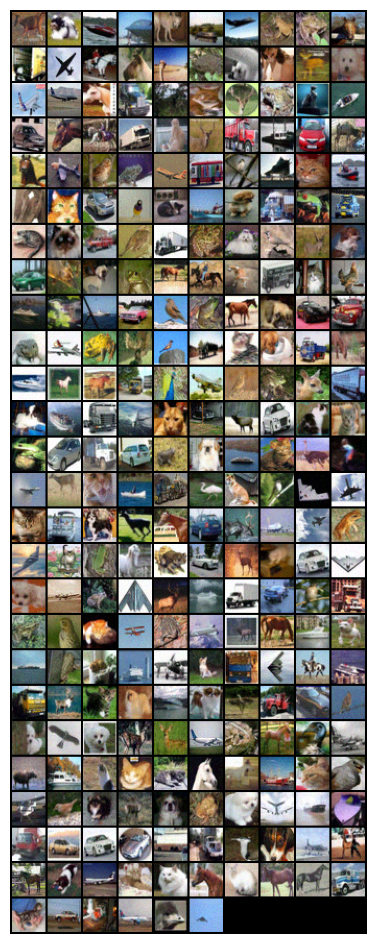

E:0	B:75	 Train Acc: 66.41%  Loss: 1.003 	 Val Acc: 58.79%  Loss: 1.242   	 Test Acc: 58.01%  Loss: 1.218  	IT: 76
E:0	B:76	 Train Acc: 66.80%  Loss: 0.956 	 Val Acc: 55.66%  Loss: 1.245   	 Test Acc: 56.64%  Loss: 1.188  	IT: 77
E:0	B:77	 Train Acc: 67.97%  Loss: 0.937 	 Val Acc: 61.91%  Loss: 1.079   	 Test Acc: 59.38%  Loss: 1.152  	IT: 78
E:0	B:78	 Train Acc: 65.23%  Loss: 0.966 	 Val Acc: 57.62%  Loss: 1.196   	 Test Acc: 59.77%  Loss: 1.154  	IT: 79
E:0	B:79	 Train Acc: 68.36%  Loss: 0.900 	 Val Acc: 56.05%  Loss: 1.134   	 Test Acc: 56.84%  Loss: 1.188  	IT: 80
E:0	B:80	 Train Acc: 69.53%  Loss: 0.961 	 Val Acc: 57.81%  Loss: 1.176   	 Test Acc: 60.16%  Loss: 1.165  	IT: 81
E:1	B:0	 Train Acc: 67.19%  Loss: 0.916 	 Val Acc: 58.20%  Loss: 1.195   	 Test Acc: 61.52%  Loss: 1.133  	IT: 82
E:1	B:1	 Train Acc: 67.58%  Loss: 0.934 	 Val Acc: 62.89%  Loss: 1.096   	 Test Acc: 61.72%  Loss: 1.123  	IT: 83
E:1	B:2	 Train Acc: 67.19%  Loss: 0.956 	 Val Acc: 59.38%  Loss: 1.180   	 Test Ac

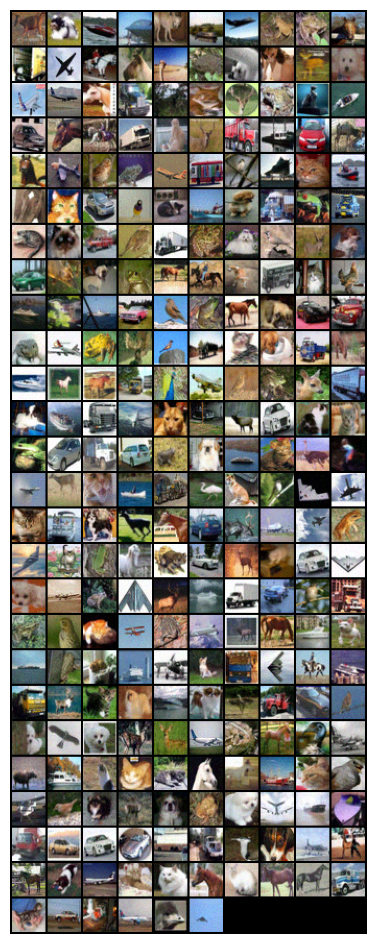



Total Time Taken:  451.40350008010864 	 Average Time:  4.514035000801086


In [33]:
train_loader = iter(cycle(train))
val_loader   = iter(cycle(val))
test_loader  = iter(cycle(test)) 




normalcurriculum = pd.DataFrame(columns= ('Path','Train Loss','Train Accuracy','Validation Loss','Validation Accuracy','Test Loss','Test Accuracy'))
path='./checkpoints/normalcurriculum'
if not os.path.exists(path):
    os.makedirs(path)

train_target = Tensor([x % num_classes for x in range(batch_size)]).to(device)      ## Creating Labels for Generator

then = time.time()
for it in range(LIM):
    learner = deepcopy(mylearners[it]).to(device)
    inner_optim = optim.SGD(learner.parameters(), **{key: value.item() for key,value in zip(list(optimizer_input.keys()),optim_params)})
    metrics={'Train Loss':[],'Train Accuracy':[],'Validation Loss':[],'Validation Accuracy':[],'Test Loss':[],'Test Accuracy':[]}

    for epoch in range(epochs):        
        for batchset in batches:
            for step in batchset:
                learner.train()
                inner_optim.zero_grad()
                if use_teacher == True:
                    train_data, train_target = curriculum_data[step], train_target
                else:
                    train_data, train_target = curriculum_data[step], curriculum_labels[step]
                    
                train_data, train_target= train_data.to(device, non_blocking=True), train_target.to(device, non_blocking=True)
                train_output = learner(train_data)
                train_loss = loss_fn(train_output, train_target) 
                train_pred = train_output.argmax(dim=1, keepdim=True) 
                train_accuracy = np.round(train_pred.eq(train_target.view_as(train_pred)).sum().item() / batch_size * 100, 2)
                train_loss.backward()
                inner_optim.step()
                    
        with torch.no_grad():    
            learner.eval()
            val_data, val_target = next(val_loader)
            (val_data, val_target) = lazy(val_data, val_target, batch=0)
            val_data, val_target= val_data.to(device), val_target.to(device)
            val_output = learner(val_data)
            val_loss = loss_fn(val_output, val_target)
            val_pred = val_output.argmax(dim=1, keepdim=True)
            val_accuracy = np.round(val_pred.eq(val_target.view_as(val_pred)).sum().item() / (2 * batch_size) * 100, 2)
        
            test_data, test_target = next(test_loader)
            (test_data, test_target) = lazy(test_data, test_target, batch=0)
            test_data, test_target= test_data.to(device), test_target.to(device)
            test_output = learner(test_data)
            test_loss = loss_fn(test_output, test_target)
            test_pred = test_output.argmax(dim=1, keepdim=True)
            test_accuracy = np.round(test_pred.eq(test_target.view_as(test_pred)).sum().item() / (2 * batch_size) * 100 ,2)

            metrics["Train Accuracy"].append(train_accuracy)
            metrics["Train Loss"].append(np.round(train_loss.item(),3))
            metrics["Validation Accuracy"].append(val_accuracy)
            metrics["Validation Loss"].append(np.round(val_loss.item(),3))
            metrics["Test Accuracy"].append(test_accuracy)
            metrics["Test Loss"].append(np.round(test_loss.item(),3))
            
    print("E:",it//steps_per_epoch, 
                  "\tB:",it%steps_per_epoch, 
                  "\t Train Acc: %5.2f" % train_accuracy, "%",
                  "  Loss: %.3f" % np.round(train_loss.item(),3),
                  " \t Val Acc: %5.2f" % val_accuracy, "%",
                  "  Loss: %.3f" % np.round(val_loss.item(),3), 
                  "   \t Test Acc: %5.2f" % test_accuracy, "%",
                  "  Loss: %.3f" % np.round(test_loss.item(),3), 
                  "  \tIT: ",(it+1),
                  sep=""
                 )
    
    inner_optim.zero_grad()
    checkpoint = { 'model': learner.state_dict(), 'optimizer': inner_optim.state_dict() }
    metrics["Path"] = f'{path}/{it}.pth'
    torch.save(checkpoint, metrics['Path'])
#     metrics["Model"]=learner.to('cpu')
#     metrics["Optimizer"]=None
    normalcurriculum.loc[it] = metrics

    if (it + 1) % plot_steps == 0:
        plot_results(train_data) 
    
    del train_loss, val_loss, test_loss, train_data, val_data, test_data, learner, inner_optim
    gc.collect()
    torch.cuda.empty_cache()
    
now = time.time()

print("\n\nTotal Time Taken: ",now-then, "\t Average Time: ", (now-then)/LIM)

# __*Normal Dataset*__

E:0	B:0	 Train Acc: 45.31%  Loss: 1.468 	 Val Acc: 45.51%  Loss: 1.474   	 Test Acc: 56.05%  Loss: 1.241  	IT: 1
E:0	B:1	 Train Acc: 39.06%  Loss: 1.613 	 Val Acc: 44.14%  Loss: 1.486   	 Test Acc: 43.75%  Loss: 1.494  	IT: 2
E:0	B:2	 Train Acc: 47.27%  Loss: 1.425 	 Val Acc: 47.66%  Loss: 1.451   	 Test Acc: 46.48%  Loss: 1.502  	IT: 3
E:0	B:3	 Train Acc: 41.02%  Loss: 1.590 	 Val Acc: 44.34%  Loss: 1.566   	 Test Acc: 45.70%  Loss: 1.539  	IT: 4
E:0	B:4	 Train Acc: 46.48%  Loss: 1.371 	 Val Acc: 46.29%  Loss: 1.462   	 Test Acc: 45.31%  Loss: 1.492  	IT: 5
E:0	B:5	 Train Acc: 43.75%  Loss: 1.507 	 Val Acc: 45.90%  Loss: 1.551   	 Test Acc: 49.80%  Loss: 1.474  	IT: 6
E:0	B:6	 Train Acc: 46.09%  Loss: 1.520 	 Val Acc: 46.48%  Loss: 1.475   	 Test Acc: 46.29%  Loss: 1.459  	IT: 7
E:0	B:7	 Train Acc: 47.66%  Loss: 1.486 	 Val Acc: 45.31%  Loss: 1.497   	 Test Acc: 43.16%  Loss: 1.557  	IT: 8
E:0	B:8	 Train Acc: 45.70%  Loss: 1.459 	 Val Acc: 49.22%  Loss: 1.426   	 Test Acc: 49.80%  Los

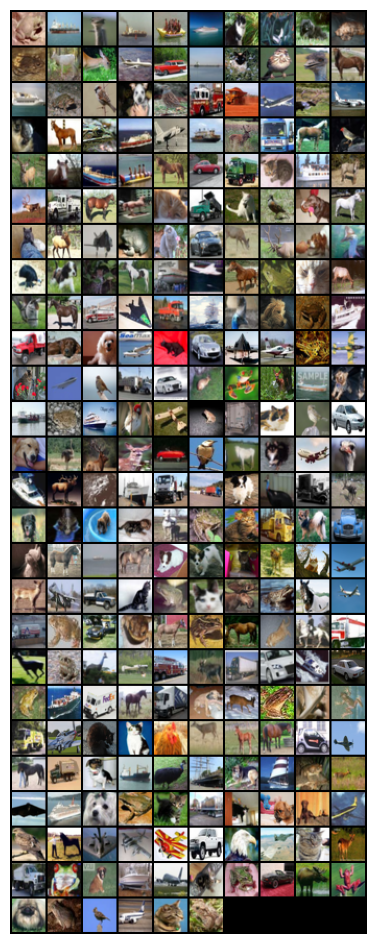

E:0	B:25	 Train Acc: 52.34%  Loss: 1.381 	 Val Acc: 51.95%  Loss: 1.364   	 Test Acc: 48.24%  Loss: 1.402  	IT: 26
E:0	B:26	 Train Acc: 43.36%  Loss: 1.710 	 Val Acc: 45.31%  Loss: 1.467   	 Test Acc: 47.85%  Loss: 1.437  	IT: 27
E:0	B:27	 Train Acc: 45.70%  Loss: 1.467 	 Val Acc: 50.59%  Loss: 1.426   	 Test Acc: 51.95%  Loss: 1.405  	IT: 28
E:0	B:28	 Train Acc: 46.48%  Loss: 1.489 	 Val Acc: 48.24%  Loss: 1.387   	 Test Acc: 45.31%  Loss: 1.379  	IT: 29
E:0	B:29	 Train Acc: 42.97%  Loss: 1.565 	 Val Acc: 43.16%  Loss: 1.529   	 Test Acc: 45.70%  Loss: 1.481  	IT: 30
E:0	B:30	 Train Acc: 42.97%  Loss: 1.628 	 Val Acc: 45.31%  Loss: 1.470   	 Test Acc: 47.46%  Loss: 1.529  	IT: 31
E:0	B:31	 Train Acc: 46.09%  Loss: 1.555 	 Val Acc: 47.07%  Loss: 1.491   	 Test Acc: 41.80%  Loss: 1.578  	IT: 32
E:0	B:32	 Train Acc: 43.36%  Loss: 1.514 	 Val Acc: 45.90%  Loss: 1.498   	 Test Acc: 43.36%  Loss: 1.500  	IT: 33
E:0	B:33	 Train Acc: 44.92%  Loss: 1.478 	 Val Acc: 48.83%  Loss: 1.408   	 Test

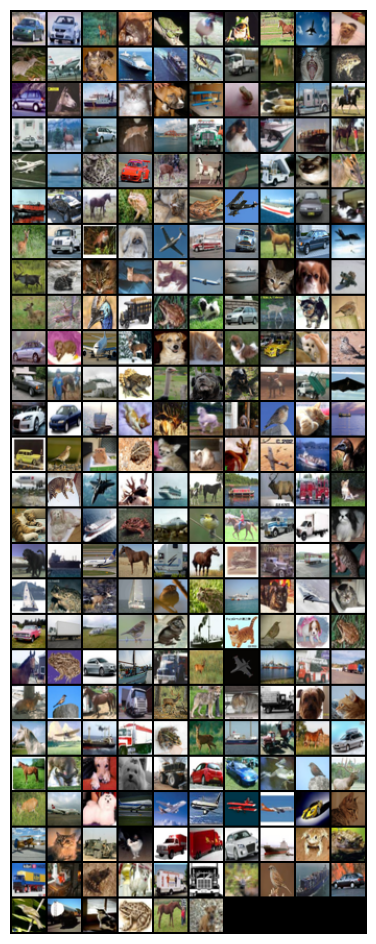

E:0	B:50	 Train Acc: 50.78%  Loss: 1.400 	 Val Acc: 44.53%  Loss: 1.518   	 Test Acc: 45.12%  Loss: 1.499  	IT: 51
E:0	B:51	 Train Acc: 49.22%  Loss: 1.540 	 Val Acc: 41.02%  Loss: 1.597   	 Test Acc: 47.46%  Loss: 1.516  	IT: 52
E:0	B:52	 Train Acc: 50.00%  Loss: 1.463 	 Val Acc: 47.46%  Loss: 1.466   	 Test Acc: 47.46%  Loss: 1.431  	IT: 53
E:0	B:53	 Train Acc: 42.58%  Loss: 1.614 	 Val Acc: 41.41%  Loss: 1.639   	 Test Acc: 40.43%  Loss: 1.572  	IT: 54
E:0	B:54	 Train Acc: 41.41%  Loss: 1.613 	 Val Acc: 41.21%  Loss: 1.621   	 Test Acc: 42.19%  Loss: 1.558  	IT: 55
E:0	B:55	 Train Acc: 48.05%  Loss: 1.467 	 Val Acc: 53.71%  Loss: 1.395   	 Test Acc: 48.24%  Loss: 1.390  	IT: 56
E:0	B:56	 Train Acc: 48.44%  Loss: 1.389 	 Val Acc: 46.09%  Loss: 1.463   	 Test Acc: 49.22%  Loss: 1.385  	IT: 57
E:0	B:57	 Train Acc: 45.31%  Loss: 1.454 	 Val Acc: 49.22%  Loss: 1.443   	 Test Acc: 44.34%  Loss: 1.522  	IT: 58
E:0	B:58	 Train Acc: 51.56%  Loss: 1.431 	 Val Acc: 51.56%  Loss: 1.412   	 Test

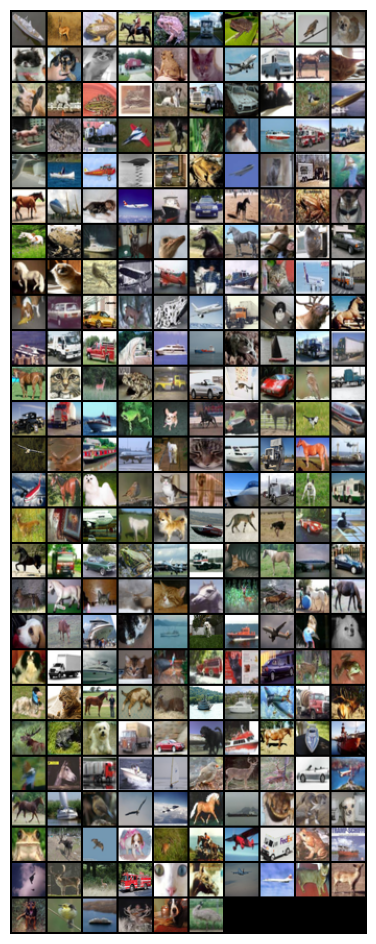

E:0	B:75	 Train Acc: 47.27%  Loss: 1.418 	 Val Acc: 47.27%  Loss: 1.455   	 Test Acc: 47.46%  Loss: 1.436  	IT: 76
E:0	B:76	 Train Acc: 43.75%  Loss: 1.472 	 Val Acc: 45.31%  Loss: 1.437   	 Test Acc: 46.88%  Loss: 1.427  	IT: 77
E:0	B:77	 Train Acc: 43.36%  Loss: 1.418 	 Val Acc: 45.51%  Loss: 1.476   	 Test Acc: 48.63%  Loss: 1.461  	IT: 78
E:0	B:78	 Train Acc: 42.19%  Loss: 1.559 	 Val Acc: 47.66%  Loss: 1.485   	 Test Acc: 45.90%  Loss: 1.460  	IT: 79
E:0	B:79	 Train Acc: 40.62%  Loss: 1.612 	 Val Acc: 43.75%  Loss: 1.586   	 Test Acc: 41.60%  Loss: 1.586  	IT: 80
E:0	B:80	 Train Acc: 47.27%  Loss: 1.399 	 Val Acc: 47.46%  Loss: 1.425   	 Test Acc: 47.85%  Loss: 1.434  	IT: 81
E:1	B:0	 Train Acc: 46.88%  Loss: 1.472 	 Val Acc: 42.97%  Loss: 1.493   	 Test Acc: 47.27%  Loss: 1.451  	IT: 82
E:1	B:1	 Train Acc: 45.70%  Loss: 1.436 	 Val Acc: 45.70%  Loss: 1.482   	 Test Acc: 49.22%  Loss: 1.438  	IT: 83
E:1	B:2	 Train Acc: 45.70%  Loss: 1.506 	 Val Acc: 42.97%  Loss: 1.508   	 Test Ac

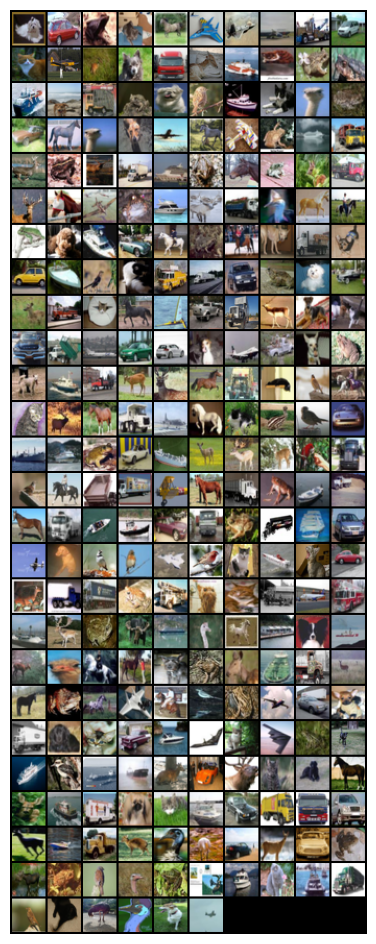



Total Time Taken:  302.3321340084076 	 Average Time:  3.0233213400840757


In [36]:
val_loader   = iter(cycle(val))
test_loader  = iter(cycle(test)) 


normaldataset = pd.DataFrame(columns= ('Path','Train Loss','Train Accuracy','Validation Loss','Validation Accuracy','Test Loss','Test Accuracy'))
path='./checkpoints/normaldataset'
if not os.path.exists(path):
    os.makedirs(path)

train_target = Tensor([x % num_classes for x in range(batch_size)]).to(device)      ## Creating Labels for Generator

then = time.time()
for it in range(LIM):
    learner = deepcopy(mylearners[it]).to(device)
    inner_optim = optim.Adam(learner.parameters(), lr=0.01)
    metrics={'Train Loss':[],'Train Accuracy':[],'Validation Loss':[],'Validation Accuracy':[],'Test Loss':[],'Test Accuracy':[]}

    for epoch in range(epochs):        
        train_loader = iter(cycle(train))
        for batchset in batches:
            for step in batchset:
                learner.train()
                inner_optim.zero_grad()
                train_data, train_target = next(train_loader)

                train_data, train_target= train_data.to(device, non_blocking=True), train_target.to(device, non_blocking=True)
                train_output = learner(train_data)
                train_loss = loss_fn(train_output, train_target) 
                train_pred = train_output.argmax(dim=1, keepdim=True) 
                train_accuracy = np.round(train_pred.eq(train_target.view_as(train_pred)).sum().item() / batch_size * 100, 2)
                train_loss.backward()
                inner_optim.step()
                    
        with torch.no_grad():    
            learner.eval()
            val_data, val_target = next(val_loader)
            (val_data, val_target) = lazy(val_data, val_target, batch=0)
            val_data, val_target= val_data.to(device), val_target.to(device)
            val_output = learner(val_data)
            val_loss = loss_fn(val_output, val_target)
            val_pred = val_output.argmax(dim=1, keepdim=True)
            val_accuracy = np.round(val_pred.eq(val_target.view_as(val_pred)).sum().item() / (2 * batch_size) * 100, 2)
        
            test_data, test_target = next(test_loader)
            (test_data, test_target) = lazy(test_data, test_target, batch=0)
            test_data, test_target= test_data.to(device), test_target.to(device)
            test_output = learner(test_data)
            test_loss = loss_fn(test_output, test_target)
            test_pred = test_output.argmax(dim=1, keepdim=True)
            test_accuracy = np.round(test_pred.eq(test_target.view_as(test_pred)).sum().item() / (2 * batch_size) * 100 ,2)

            metrics["Train Accuracy"].append(train_accuracy)
            metrics["Train Loss"].append(np.round(train_loss.item(),3))
            metrics["Validation Accuracy"].append(val_accuracy)
            metrics["Validation Loss"].append(np.round(val_loss.item(),3))
            metrics["Test Accuracy"].append(test_accuracy)
            metrics["Test Loss"].append(np.round(test_loss.item(),3))
            
    print("E:",it//steps_per_epoch, 
                  "\tB:",it%steps_per_epoch, 
                  "\t Train Acc: %5.2f" % train_accuracy, "%",
                  "  Loss: %.3f" % np.round(train_loss.item(),3),
                  " \t Val Acc: %5.2f" % val_accuracy, "%",
                  "  Loss: %.3f" % np.round(val_loss.item(),3), 
                  "   \t Test Acc: %5.2f" % test_accuracy, "%",
                  "  Loss: %.3f" % np.round(test_loss.item(),3), 
                  "  \tIT: ",(it+1),
                  sep=""
                 )
                    
    inner_optim.zero_grad()
    checkpoint = { 'model': learner.state_dict(), 'optimizer': inner_optim.state_dict() }
    metrics["Path"] = f'{path}/{it}.pth'
    torch.save(checkpoint, metrics['Path'])
#     metrics["Model"]=learner.to('cpu')
#     metrics["Optimizer"]=None
    normaldataset.loc[it] = metrics

    if (it + 1) % plot_steps == 0:
        plot_results(train_data) 
    
    del train_loss, val_loss, test_loss, train_data, val_data, test_data, learner, inner_optim
    gc.collect()
    torch.cuda.empty_cache()
    
now = time.time()

print("\n\nTotal Time Taken: ",now-then, "\t Average Time: ", (now-then)/LIM)

# __*Results*__

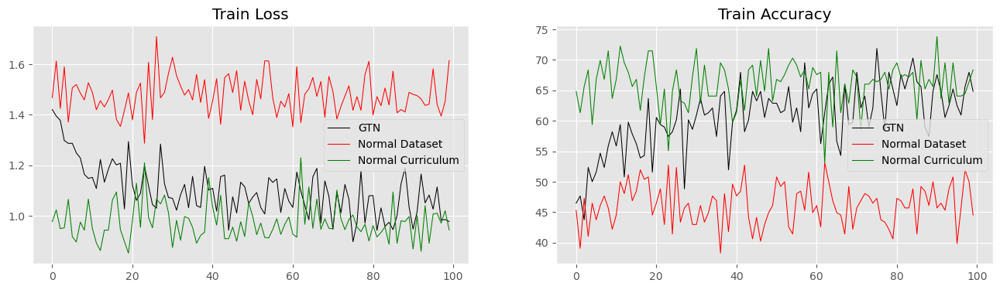

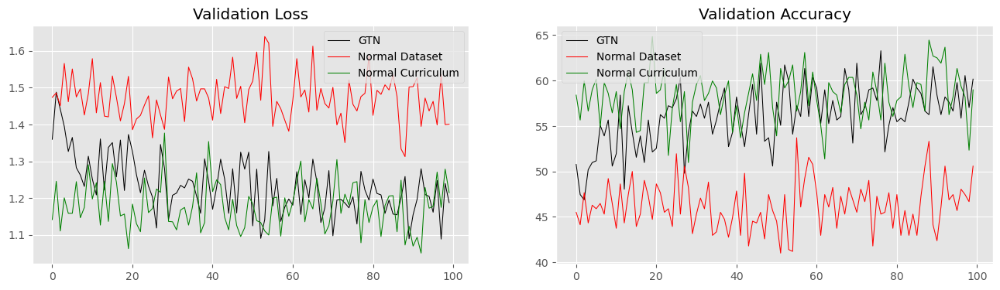

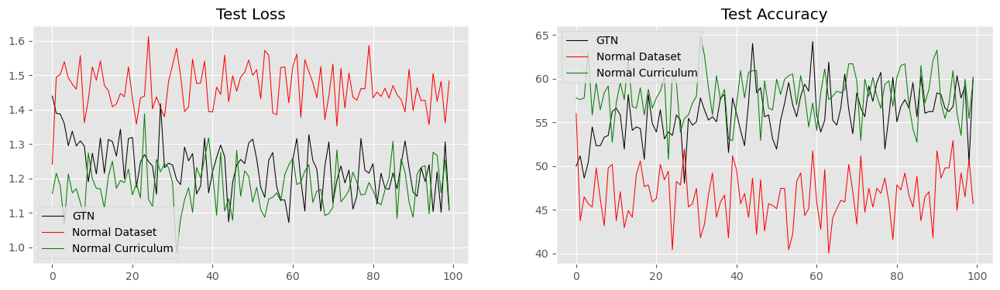

In [38]:
plt.style.use('ggplot')
plt.rcParams["figure.figsize"] = (16,4)


plt.subplot(1,2,1)
plt.plot(range(LIM),gtn["Train Loss"].apply(lambda x:x[-1]),              label="GTN",              linewidth=0.75, color="black")
plt.plot(range(LIM),normaldataset["Train Loss"].apply(lambda x:x[-1]),    label="Normal Dataset",   linewidth=0.75, color="red")
plt.plot(range(LIM),normalcurriculum["Train Loss"].apply(lambda x:x[-1]), label="Normal Curriculum",linewidth=0.75, color="green")
# plt.plot(range(LIM),gtncurriculum["Train Loss"].apply(lambda x:x[-1]),    label="GTN Curriculum",   linewidth=0.75, color="blue")
# plt.plot(range(LIM),gtndataset["Train Loss"].apply(lambda x:x[-1]),       label="GTN Dataset",      linewidth=0.75, color="gray")
plt.title("Train Loss")
plt.legend()
plt.subplot(1,2,2)
plt.plot(range(LIM),gtn["Train Accuracy"].apply(lambda x:x[-1]),              label= "GTN",             linewidth=0.75, color= "black")
plt.plot(range(LIM),normaldataset["Train Accuracy"].apply(lambda x:x[-1]),    label="Normal Dataset",   linewidth=0.75, color= "red")
plt.plot(range(LIM),normalcurriculum["Train Accuracy"].apply(lambda x:x[-1]), label="Normal Curriculum",linewidth=0.75, color= "green")
# plt.plot(range(LIM),gtncurriculum["Train Accuracy"].apply(lambda x:x[-1]),    label="GTN Curriculum",   linewidth=0.75, color= "blue")
# plt.plot(range(LIM),gtndataset["Train Accuracy"].apply(lambda x:x[-1]),       label="GTN Dataset",      linewidth=0.75, color= "gray")

plt.title("Train Accuracy")
plt.legend()
plt.show()

plt.subplot(1,2,1)
plt.plot(range(LIM),gtn["Validation Loss"].apply(lambda x:x[-1]),              label="GTN",              linewidth=0.75, color="black")
plt.plot(range(LIM),normaldataset["Validation Loss"].apply(lambda x:x[-1]),    label="Normal Dataset",   linewidth=0.75, color="red")
plt.plot(range(LIM),normalcurriculum["Validation Loss"].apply(lambda x:x[-1]), label="Normal Curriculum",linewidth=0.75, color="green")
# plt.plot(range(LIM),gtncurriculum["Validation Loss"].apply(lambda x:x[-1]),    label="GTN Curriculum",   linewidth=0.75, color="blue")
# plt.plot(range(LIM),gtndataset["Validation Loss"].apply(lambda x:x[-1]),       label="GTN Dataset",      linewidth=0.75, color="gray")
plt.title("Validation Loss")
plt.legend()
plt.subplot(1,2,2)
plt.plot(range(LIM),gtn["Validation Accuracy"].apply(lambda x:x[-1]),              label= "GTN",             linewidth=0.75, color= "black")
plt.plot(range(LIM),normaldataset["Validation Accuracy"].apply(lambda x:x[-1]),    label="Normal Dataset",   linewidth=0.75, color= "red")
plt.plot(range(LIM),normalcurriculum["Validation Accuracy"].apply(lambda x:x[-1]), label="Normal Curriculum",linewidth=0.75, color= "green")
# plt.plot(range(LIM),gtncurriculum["Validation Accuracy"].apply(lambda x:x[-1]),    label="GTN Curriculum",   linewidth=0.75, color= "blue")
# plt.plot(range(LIM),gtndataset["Validation Accuracy"].apply(lambda x:x[-1]),       label="GTN Dataset",      linewidth=0.75, color= "gray")
plt.title("Validation Accuracy")
plt.legend()
plt.show()

plt.subplot(1,2,1)
plt.plot(range(LIM),gtn["Test Loss"].apply(lambda x:x[-1]),              label="GTN",              linewidth=0.75, color="black")
plt.plot(range(LIM),normaldataset["Test Loss"].apply(lambda x:x[-1]),    label="Normal Dataset",   linewidth=0.75, color="red")
plt.plot(range(LIM),normalcurriculum["Test Loss"].apply(lambda x:x[-1]), label="Normal Curriculum",linewidth=0.75, color="green")
# plt.plot(range(LIM),gtncurriculum["Test Loss"].apply(lambda x:x[-1]),    label="GTN Curriculum",   linewidth=0.75, color="blue")
# plt.plot(range(LIM),gtndataset["Test Loss"].apply(lambda x:x[-1]),       label="GTN Dataset",      linewidth=0.75, color="gray")
plt.title("Test Loss")
plt.legend()
plt.subplot(1,2,2)
plt.plot(range(LIM),gtn["Test Accuracy"].apply(lambda x:x[-1]),              label= "GTN",             linewidth=0.75, color= "black")
plt.plot(range(LIM),normaldataset["Test Accuracy"].apply(lambda x:x[-1]),    label="Normal Dataset",   linewidth=0.75, color= "red")
plt.plot(range(LIM),normalcurriculum["Test Accuracy"].apply(lambda x:x[-1]), label="Normal Curriculum",linewidth=0.75, color= "green")
# plt.plot(range(LIM),gtncurriculum["Test Accuracy"].apply(lambda x:x[-1]),    label="GTN Curriculum",   linewidth=0.75, color= "blue")
# plt.plot(range(LIM),gtndataset["Test Accuracy"].apply(lambda x:x[-1]),       label="GTN Dataset",      linewidth=0.75, color= "gray")
plt.title("Test Accuracy")
plt.legend()
plt.show()

# plt.tight_layout()
